In [1]:
import numpy as np
from VoCC import VortexCorrelationClustering
import plotly.express as px
import plotly.graph_objects as go

%run ./scripts/experiment_utils.py

DEPTH_STRIDE = 6
MIN_PARTICLES = 40

In [2]:
coordinates = np.load('./data/particles_29102011_depth.npy')
X,Y,U,V,D = coordinates.T

# The magnitude of the movement are two days we normalize them to one.
U /= 2
V /= 2
# Set outliers to zero
U[U > 1] = 0
V[V > .5] = 0

In [3]:
twod_vocc = VortexCorrelationClustering(
    radii=np.arange(4,24,4),
    cell_size= .07, 
    sectors = 15, 
    circle_coverage_rate = .75, 
    qth_threshold = .99, 
    min_points = .01,
)
default_labels = twod_vocc.fit(coordinates).labels_

<GeoAxesSubplot:>

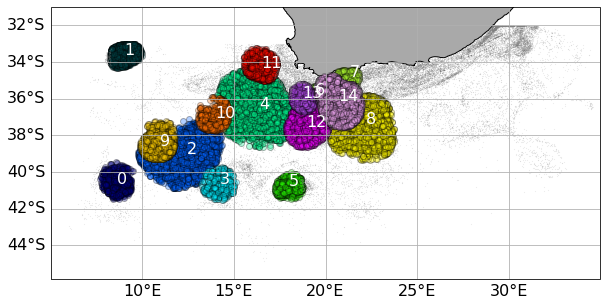

In [ ]:
create_real_world_image(coordinates, default_labels, f'01_vocc_clustering_{DEPTH_STRIDE}', True)

In [5]:
acc = twod_vocc.accumulator_.squeeze()

fig = go.Figure()

for step in range(acc.shape[0]):
   fig.add_trace(go.Heatmap(z=acc[step], colorscale='Viridis'))

fig.data[0].visible = True

steps = []

for i in range(len(fig.data)):
   step = dict(
      method="restyle",
      args=["visible", [False] * len(fig.data)],
   )
   step["args"][1][i] = True
   steps.append(step)

sliders = [dict(
   active=0,
   currentvalue={"prefix": "Radius: "},
   steps=steps,
)]

fig.update_layout(
   sliders=sliders
)

fig.show()
